In [1]:
import numpy as np


# ✅ Patch numpy for DeepFace compatibility
if not hasattr(np, 'typeDict'):
    np.typeDict = np.sctypeDict
    
import h5py

# ✅ Patch h5py to bypass the __reduce_cython__ error
def patched_reduce_cython(self):
    raise TypeError(f"Cannot pickle object of type {type(self)}")

if hasattr(h5py.h5a.AttrID, '__reduce_cython__'):
    h5py.h5a.AttrID.__reduce_cython__ = patched_reduce_cython


In [2]:
import pandas as pd
import os
import csv
import numpy as np
from PIL import Image
from glob import glob
from sklearn.metrics.pairwise import polynomial_kernel
from torchvision.models import inception_v3
from torchvision import transforms
from torch.nn.functional import adaptive_avg_pool2d
import torch


In [3]:
!pip install torchvision

Defaulting to user installation because normal site-packages is not writeable


In [4]:
!pip install insightface


Defaulting to user installation because normal site-packages is not writeable
  Using cached numpy-1.24.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3
ERROR: Could not install packages due to an OSError: [Errno 16] Device or resource busy: '.nfs414fb97d434b714400000a3a'



In [5]:
!pip install onnxruntime


Defaulting to user installation because normal site-packages is not writeable


In [6]:
import insightface
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
import cv2
import numpy as np


import cv2
import numpy as np
from insightface.app import FaceAnalysis

# Initialize InsightFace model
app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
app.prepare(ctx_id=0)
genderage_model = app.models.get('genderage')
session = genderage_model.session

def estimate_age_from_cropped(img_path):
    img = cv2.imread(img_path)
    if img is None:
        print("❌ Failed to load image.")
        return None, None

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (96, 96)).astype(np.float32)
    blob = np.transpose(img_resized, (2, 0, 1))
    blob = np.expand_dims(blob, axis=0)

    input_name = session.get_inputs()[0].name
    output = session.run(None, {input_name: blob})[0]

    # Extract values
    female_score = output[0][0]
    male_score = output[0][1]
    age_score = output[0][2]  # normalized age value in [0, 1]

    gender = "male" if male_score > female_score else "female"
    age = age_score * 100

    return age, gender


/home/koppisetty.e/.local/lib/python3.8/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.18). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/koppisetty.e/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/koppisetty.e/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/koppisetty.e/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/koppisetty.e/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/koppisetty.e/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None

In [7]:
!pip install deepface


Defaulting to user installation because normal site-packages is not writeable
  Using cached numpy-1.24.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Using cached typing_extensions-4.5.0-py3-none-any.whl (27 kB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 4.13.2
    Uninstalling typing-extensions-4.13.2:
      Successfully uninstalled typing-extensions-4.13.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
-orch 2.4.1 requires typing-extensions>=4.8.0, but you have typing-extensions 4.5.0 which is incompatible.
tyro 0.9.2 requires typing-extensions>=4.9.0; python_version >= "3.8", but you have typing-extensions 4.5.0 which is incompatible.


In [36]:
import os 
import cv2
from deepface import DeepFace

"""Contains helper methods for evaluateModel.py"""

def parse_filename_metadata(filename):
    try:
        # If filename ends with _aged_<age>.jpg
        if "aged_" in filename:
            age_part = filename.split("aged_")[-1].split(".")[0]
            age = int(age_part)
        else:
            # Assume original format: <age>_<gender>_...jpg
            parts = filename.split("_")
            age = int(parts[0])

        # Gender is still second item in the original part
        gender_code = filename.split("_")[1]
        gender = "male" if gender_code == "0" else "female"

        return age, gender

    except Exception as e:
        print(f"⚠️ Failed to parse: {filename} — {e}")
        return None, None

    


def compute_blurriness(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None
    return cv2.Laplacian(img, cv2.CV_64F).var()



def detect_expression(img_path):
    try:
        analysis = DeepFace.analyze(img_path, actions=['emotion'], enforce_detection=False)
        return analysis[0]['dominant_emotion']  # e.g., 'happy', 'neutral', 'sad'
    except Exception as e:
        print(f"❌ Error analyzing {img_path}: {e}")
        return None



def evaluate_folder(img_folder):
    results = []
    for fname in os.listdir(img_folder):
        if fname.lower().endswith((".jpg", ".jpeg", ".png")):
            img_path = os.path.join(img_folder, fname)
            actual_age, actual_gender = parse_filename_metadata(fname)
            predicted_age, predicted_gender = estimate_age_from_cropped(img_path)
            blurriness = compute_blurriness(img_path)
            expression = detect_expression(img_path)

            results.append({
                "filename": fname,
                "actual_age": actual_age,
                "predicted_age": predicted_age,
                "actual_gender": actual_gender,
                "predicted_gender": predicted_gender,
                "blurriness": blurriness,
                "expression": expression
            })
    return results


In [37]:
%ls


data/                          outputs_part2.csv  outputs_part9.csv
DL_model-adding 5 years.ipynb  outputs_part3.csv  subset150/
DL_model_addRandomAge.ipynb    outputs_part4.csv  Untitled.ipynb
evaluationPipeline.ipynb       outputs_part6.csv  utk_train_balanced.csv
outputs/                       outputs_part7.csv
outputs_part1.csv              outputs_part8.csv


In [124]:
OUTPUT_CSV_BASELINE = "outputs/eval_outputs_baseline.csv"
CLEAN_IMAGE_FOLDER_BASELINE = "subset150"
AGED_IMAGE_FOLDER_BASELINE = "outputs/baselines"
VISUAL_CSVS_BASELINE = [f"outputs_part{i}.csv" for i in {1,2,3,4,6,7,8,9}]

OUTPUT_CSV = "outputs/eval_outputs_finetuned.csv"
CLEAN_IMAGE_FOLDER = "subset150"
AGED_IMAGE_FOLDER = "outputs/finetuned"
VISUAL_CSVS = [f"outputs_part{i}.csv" for i in {1,2,3,4,6,7,8,9}]

In [125]:
print("📦 Loading all batch metadata for baseline model...")
df = pd.concat([pd.read_csv(csv_path) for csv_path in VISUAL_CSVS_BASELINE], ignore_index=True)
df.to_csv(OUTPUT_CSV_BASELINE, index=False)
print(f"✅ Combined CSV saved to: {OUTPUT_CSV_BASELINE}")


print("📦 Loading all batch metadata for finetuned model...")
df = pd.concat([pd.read_csv(csv_path) for csv_path in VISUAL_CSVS], ignore_index=True)
df.to_csv(OUTPUT_CSV, index=False)
print(f"✅ Combined CSV saved to: {OUTPUT_CSV}")

📦 Loading all batch metadata for baseline model...
✅ Combined CSV saved to: outputs/eval_outputs_baseline.csv
📦 Loading all batch metadata for finetuned model...
✅ Combined CSV saved to: outputs/eval_outputs_finetuned.csv


In [126]:
print("🔍 Evaluating generated and original images for baseline model...")
generated_results_baseline = evaluate_folder(AGED_IMAGE_FOLDER_BASELINE)
original_results_baseline = evaluate_folder(CLEAN_IMAGE_FOLDER_BASELINE)




🔍 Evaluating generated and original images for baseline model...


In [127]:
os.makedirs("data/csv", exist_ok=True)
with open("data/csv/generated_results_baseline.csv", "w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=generated_results[0].keys())
    writer.writeheader()
    writer.writerows(generated_results_baseline)
    
with open("data/csv/original_results_baseline.csv", "w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=original_results[0].keys())
    writer.writeheader()
    writer.writerows(original_results_baseline)


In [85]:
def compute_mae(results):
    vals = [abs(r['predicted_age'] - r['actual_age']) for r in results
            if r['predicted_age'] is not None and r['actual_age'] is not None]
    return sum(vals) / len(vals) if vals else None

def compute_gender_preservation(results):
    matches = [1 for r in results
               if r['actual_gender'] and r['predicted_gender'] and
               r['actual_gender'].lower() == r['predicted_gender'].lower()]
    return (sum(matches) / len(results)) * 100 if results else None

def compute_average_blurriness(results):
    vals = [r['blurriness'] for r in results if r['blurriness'] is not None]
    return sum(vals) / len(vals) if vals else None

def match_by_filename(orig, aged):
    aged_dict = {r['filename']: r for r in aged}
    return [(o, aged_dict[o['filename']]) for o in orig if o['filename'] in aged_dict]

def compute_expression_preservation(pairs):
    correct = sum(1 for o, a in pairs
                  if o['expression'] and a['expression'] and
                  o['expression'].lower() == a['expression'].lower())
    return (correct / len(pairs)) * 100 if pairs else None

In [128]:
mae_baseline = compute_mae(generated_results_baseline)
gender_pres_baseline = compute_gender_preservation(generated_results_baseline)
blurriness_baseline = compute_average_blurriness(generated_results_baseline)
matched_baseline = match_by_filename(original_results_baseline, generated_results_baseline)
expression_pres_baseline = compute_expression_preservation(matched_baseline)

print("Baseline model results:")
print(f"\n📊 Evaluation Results")
print(f"✅ Mean Absolute Error (MAE): {mae:.2f}")
print(f"✅ Gender Preservation: {gender_pres:.2f}%")
print(f"🔍 Avg. Blurriness: {blurriness:.2f}")
if expression_pres is not None:
    print(f"😊 Expression Preservation: {expression_pres:.2f}%")
else:
    print("😊 Expression Preservation: N/A (no valid pairs)")



Baseline model results:

📊 Evaluation Results
✅ Mean Absolute Error (MAE): 23.95
✅ Gender Preservation: 80.95%
🔍 Avg. Blurriness: 397.48
😊 Expression Preservation: N/A (no valid pairs)


In [88]:
import matplotlib.pyplot as plt
import math
from PIL import Image
import os

def show_gender_mismatches(results, image_folder, num_samples=10, images_per_row=5):
    mismatches = []
    for r in results:
        if r['actual_gender'] and r['predicted_gender']:
            if r['actual_gender'].strip().lower() != r['predicted_gender'].strip().lower():
                mismatches.append(r)

    if not mismatches:
        print("✅ No gender mismatches found.")
        return

    num_samples = min(num_samples, len(mismatches))
    num_rows = math.ceil(num_samples / images_per_row)

    print(f"🔍 Showing {num_samples} gender mismatches ({images_per_row} per row)...")

    fig, axs = plt.subplots(num_rows, images_per_row, figsize=(images_per_row * 4, num_rows * 4))
    axs = axs.flatten() if num_samples > 1 else [axs]

    for i in range(images_per_row * num_rows):
        ax = axs[i]
        if i < num_samples:
            r = mismatches[i]
            img_path = os.path.join(image_folder, r['filename'])
            try:
                img = Image.open(img_path).convert("RGB")
                ax.imshow(img)
                ax.axis("off")
                ax.set_title(
                    f"{r['filename']}\nActual: {r['actual_gender']}, Pred: {r['predicted_gender']}",
                    fontsize=9
                )
            except Exception as e:
                ax.axis("off")
                print(f"❌ Could not open image: {r['filename']} — {e}")
        else:
            ax.axis("off")  # Hide unused subplots

    plt.tight_layout()
    plt.show()


showing baseline model gender mismatch
🔍 Showing 15 gender mismatches (5 per row)...


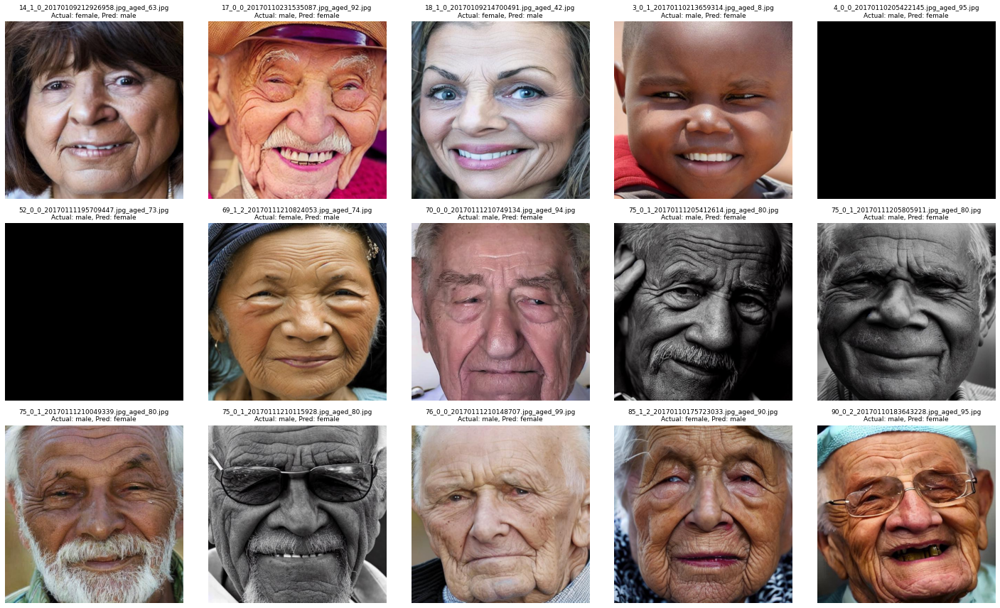

In [93]:
results_baseline = evaluate_folder("outputs/baselines")  # Or wherever your aged images are
print("showing baseline model gender mismatch")
show_gender_mismatches(results, "outputs/baselines", num_samples=15)
#seems like an issue with gender predictor in evaluation... after checking images the gender is preserved

In [94]:
import matplotlib.pyplot as plt

def plot_mae_distribution(results, bins=20):
    errors = [
        abs(r['predicted_age'] - r['actual_age'])
        for r in results
        if r['predicted_age'] is not None and r['actual_age'] is not None
    ]
    
    if not errors:
        print("⚠️ No valid age data to plot.")
        return

    plt.figure(figsize=(8, 5))
    plt.hist(errors, bins=bins, color="skyblue", edgecolor="black")
    plt.title("MAE Distribution (|Predicted Age - Actual Age|)")
    plt.xlabel("Absolute Error (years)")
    plt.ylabel("Number of Images")
    plt.grid(True)
    plt.show()


Baseline MAE age distribution 


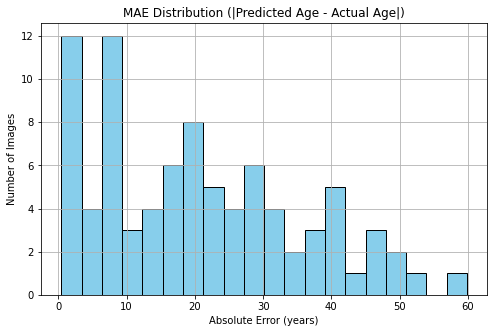

In [96]:
print("Baseline MAE age distribution ")
plot_mae_distribution(results_baseline)


In [103]:
import matplotlib.pyplot as plt
import math
from PIL import Image
import os

def show_aged_age_predictions(results, image_folder, num_samples=6):
    """
    Show up to `num_samples` aged images with actual vs predicted age.
    Displays 2 images per row.
    """
    valid_results = [
        r for r in results
        if r['actual_age'] is not None and r['predicted_age'] is not None
    ]

    if not valid_results:
        print("⚠️ No valid age results to display.")
        return

    num_samples = min(num_samples, len(valid_results))
    num_rows = math.ceil(num_samples / 2)

    print(f"🧓 Showing {num_samples} aged images (2 per row)...")

    fig, axs = plt.subplots(num_rows, 2, figsize=(10, 5 * num_rows))
    axs = axs.flatten() if num_rows > 1 else [axs[0], axs[1]]

    for idx in range(num_rows * 2):
        ax = axs[idx]

        if idx < num_samples:
            r = valid_results[idx]
            img_path = os.path.join(image_folder, r['filename'])

            try:
                img = Image.open(img_path).convert("RGB")
                ax.imshow(img)
                ax.axis("off")
                ax.set_title(
                    f"{r['filename']}\nActual: {r['actual_age']}, Pred: {r['predicted_age']:.1f}",
                    fontsize=9
                )
            except Exception as e:
                ax.axis("off")
                print(f"❌ Failed to open image: {r['filename']} — {e}")
        else:
            ax.axis("off")  # Hide empty subplot slots

    plt.tight_layout()
    plt.show()


Showing age mismatches for baseline model
🧓 Showing 16 aged images (2 per row)...


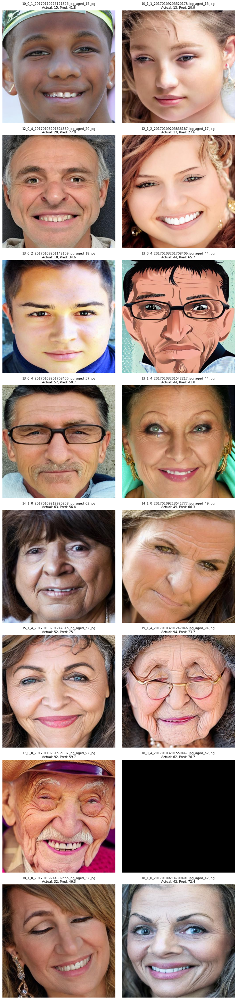

In [105]:
print("Showing age mismatches for baseline model")
show_aged_age_predictions(
    results=generated_results,
    image_folder="outputs/baselines",
    num_samples=16  # or 10, 6, etc.
)



In [106]:
print("🔍 Evaluating generated and original images for finetuned model...")
generated_results_finetuned = evaluate_folder(AGED_IMAGE_FOLDER)
original_results_finetuned = evaluate_folder(CLEAN_IMAGE_FOLDER)

🔍 Evaluating generated and original images for finetuned model...


In [107]:
os.makedirs("data/csv", exist_ok=True)
with open("data/csv/generated_results_finetuned.csv", "w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=generated_results[0].keys())
    writer.writeheader()
    writer.writerows(generated_results)
    
with open("data/csv/original_results_finetuned.csv", "w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=original_results[0].keys())
    writer.writeheader()
    writer.writerows(original_results)

In [116]:
mae_finetuned = compute_mae(generated_results_finetuned)
gender_pres_finetuned = compute_gender_preservation(generated_results_finetuned)
blurriness_finetuned = compute_average_blurriness(generated_results_finetuned)
matched_finetuned = match_by_filename(original_results_finetuned, generated_results_finetuned)
expression_pres_finetuned = compute_expression_preservation(matched_finetuned)
print("Finetuned model results:")
print(f"\n📊 Evaluation Results")
print(f"✅ Mean Absolute Error (MAE): {mae:.2f}")
print(f"✅ Gender Preservation: {gender_pres:.2f}%")
print(f"🔍 Avg. Blurriness: {blurriness:.2f}")
if expression_pres is not None:
    print(f"😊 Expression Preservation: {expression_pres:.2f}%")
else:
    print("😊 Expression Preservation: N/A (no valid pairs)")


Finetuned model results:

📊 Evaluation Results
✅ Mean Absolute Error (MAE): 23.95
✅ Gender Preservation: 80.95%
🔍 Avg. Blurriness: 397.48
😊 Expression Preservation: N/A (no valid pairs)


🔍 Showing 15 gender mismatches (5 per row)...


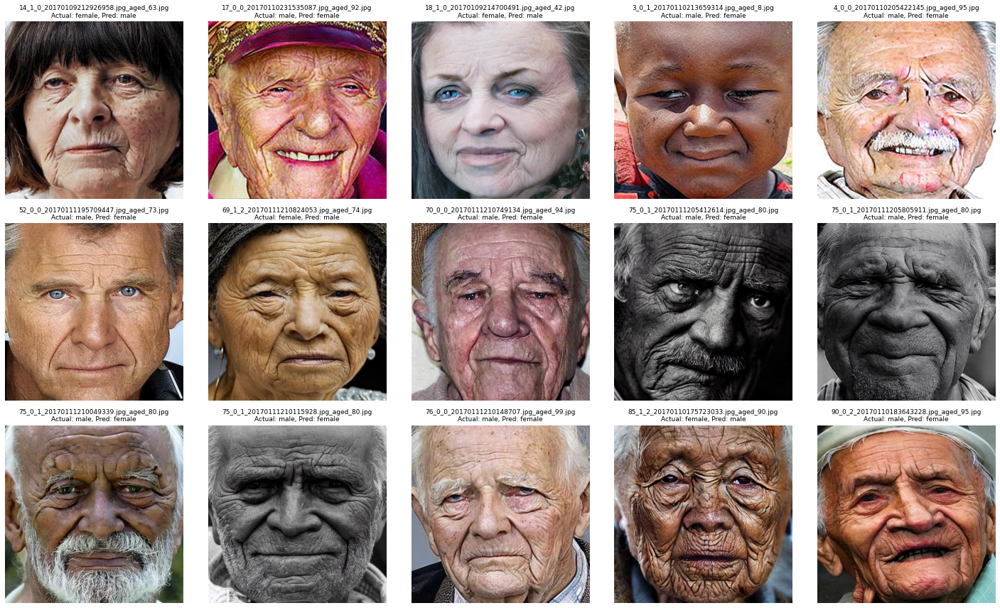

In [109]:
results = evaluate_folder("outputs/finetuned")  # Or wherever your aged images are
show_gender_mismatches(results, "outputs/finetuned", num_samples=15)
#seems like an issue with gender predictor in evaluation... after checking images the gender is preserved

Finetuned model MAE age distribution 


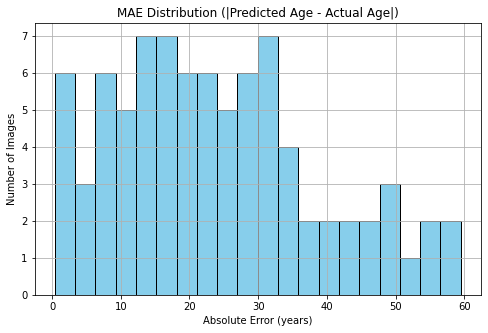

In [114]:
print("Finetuned model MAE age distribution ")
plot_mae_distribution(results)

Showing age mismatches for finetuned model
🧓 Showing 16 aged images (2 per row)...


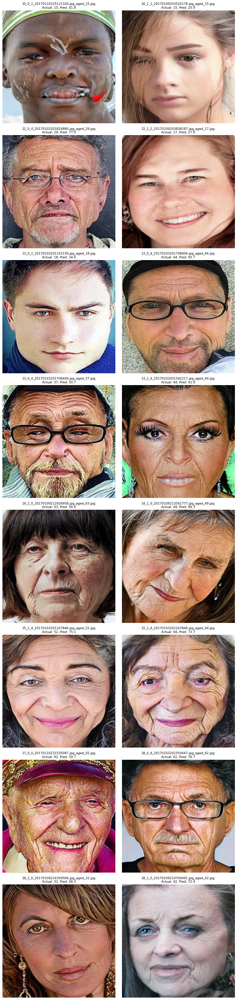

In [115]:
print("Showing age mismatches for finetuned model")
show_aged_age_predictions(
    results=generated_results,
    image_folder="outputs/finetuned",
    num_samples=16  # or 10, 6, etc.
)


In [112]:
print("\n📉 Computing KID...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
inception = inception_v3(pretrained=True, transform_input=False).to(device)
inception.eval()

transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

def extract_features(paths):
    feats = []
    for p in paths:
        try:
            img = Image.open(p).convert("RGB")
            tensor = transform(img).unsqueeze(0).to(device)
            with torch.no_grad():
                output = inception(tensor)
                pooled = adaptive_avg_pool2d(output, (1, 1)).squeeze().cpu().numpy()
                feats.append(pooled)
        except Exception as e:
            print(f"❌ {p}: {e}")
    return np.array(feats)

real_paths = glob(f"{CLEAN_IMAGE_FOLDER}/*.jpg")
gen_paths = glob(f"{AGED_IMAGE_FOLDER}/*.jpg")

real_feats = extract_features(real_paths)
gen_feats = extract_features(gen_paths)

kxx = polynomial_kernel(real_feats, real_feats)
kyy = polynomial_kernel(gen_feats, gen_feats)
kxy = polynomial_kernel(real_feats, gen_feats)

m, n = real_feats.shape[0], gen_feats.shape[0]
kid = kxx.sum() / (m*m) + kyy.sum() / (n*n) - 2 * kxy.sum() / (m*n)
print(f"📉 Kernel Inception Distance (KID): {kid:.4f}")


📉 Computing KID...
❌ subset150/100_1_0_20170110183726390.jpg: Input dimension should be at least 3
❌ subset150/100_1_2_20170110182836729.jpg: Input dimension should be at least 3
❌ subset150/10_0_1_20170110225121326.jpg: Input dimension should be at least 3
❌ subset150/10_1_1_20170109203520178.jpg: Input dimension should be at least 3
❌ subset150/110_1_1_20170110155201038.jpg: Input dimension should be at least 3
❌ subset150/110_1_3_20170110155139762.jpg: Input dimension should be at least 3
❌ subset150/12_0_4_20170103201824880.jpg: Input dimension should be at least 3
❌ subset150/12_1_2_20170109203838187.jpg: Input dimension should be at least 3
❌ subset150/13_0_2_20170103201143159.jpg: Input dimension should be at least 3
❌ subset150/13_0_4_20170103201708406.jpg: Input dimension should be at least 3
❌ subset150/13_1_4_20170103201542217.jpg: Input dimension should be at least 3
❌ subset150/14_1_0_20170109212926958.jpg: Input dimension should be at least 3
❌ subset150/14_1_0_201701092

ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.